# Indian Food Classification using Tensorflow (CNN Transfer learning)

In [1]:
# Import Dependencies
import cv2
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 

import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
from PIL import Image
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from skimage.io import imread

K.clear_session()

## Challenges

**1. Cleaning the dataset due to following :**
- A lot of misspelled labels.
- Overwhelming number of raw images not related to any class.

**2. Training model without bias :**
- Similarly looking items with common attributes (Fried samosa and pakode looks familiar.)
- Multiple labels clashing together (Butter Naan and Dal Makhni in one picture, Samosa and Pakode, etc.)
- Unwanted feature selection because of big architectures in transfer learning (Ketchup and green chutney is most common thing alongside pakode, samosa, kathi rolls and what not.)

## IMAGE PROCESSSING
Let's understand the Data and Do some Stuffs

In [8]:
img = plt.imread(r'dataset/Dataset/train/pizza/033.jpg')
dims = np.shape(img)
dims

(619, 1100, 3)

In [10]:
matrix = np.reshape(img , (dims[0] * dims[1] , dims[2]))
print(np.shape(matrix))

(680900, 3)


Image Shape:- (619, 1100)
Color Channels:- 3
Min Color Depth : 0, Max Color Depth 255


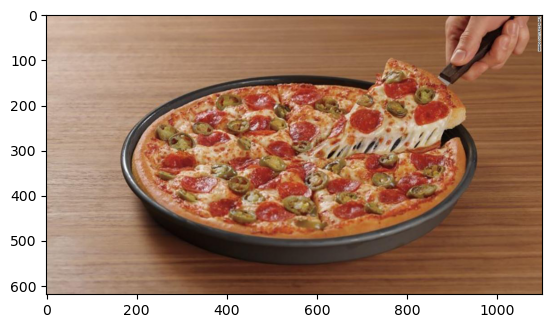

In [12]:
plt.imshow(img)
print("Image Shape:-" , dims[:2])
print("Color Channels:-", dims[2])
print("Min Color Depth : {}, Max Color Depth {}".format(np.min(img) , np.max(img)))

Plot for visualizing pixel intensities for RGB in color space


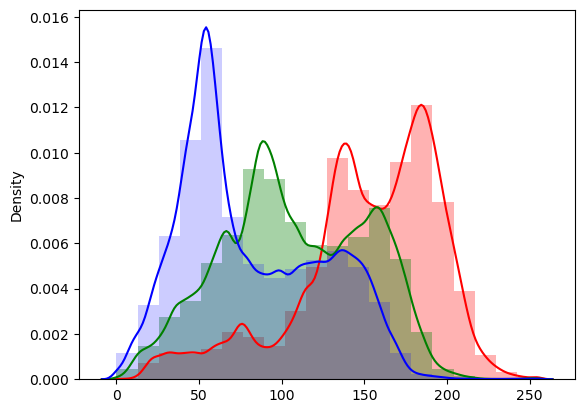

In [15]:
sns.distplot(matrix[:,0], bins=20,color="red",hist_kws=dict(alpha=0.3))
sns.distplot(matrix[:,1], bins=20,color="green",hist_kws=dict(alpha=0.35))
sns.distplot(matrix[:,2], bins=20,color="blue",hist_kws=dict(alpha=0.2))
plt.show()

Plot for visualizing histogram between 2 color channel

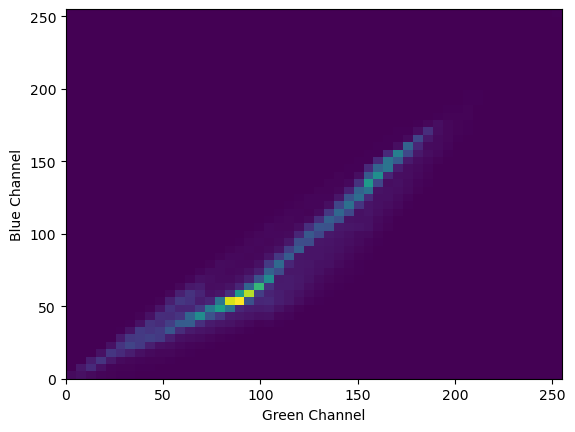

In [17]:
_ = plt.hist2d(matrix[:,1] , matrix[:,2] , bins = (50,50))
plt.xlabel("Green Channel")
plt.ylabel("Blue Channel")
plt.show()

 - The pixels between green and blue bands are correlated (as evident from overlapping on above graph), and typically has visible imagery.

 - Raw band differences will need to be scaled or thresholded

Image data consists of variations due to resolution differences between scenes, 
pixel intensities of an image and the environment around which the image was taken. 
This area of image processing is critical in today's time with the rise of Artificial 
intelligence.From motion detection to complex circuits in self driving car, 
the research requires tremendous amount of work and can be seen as widely growing areas of computer vision.

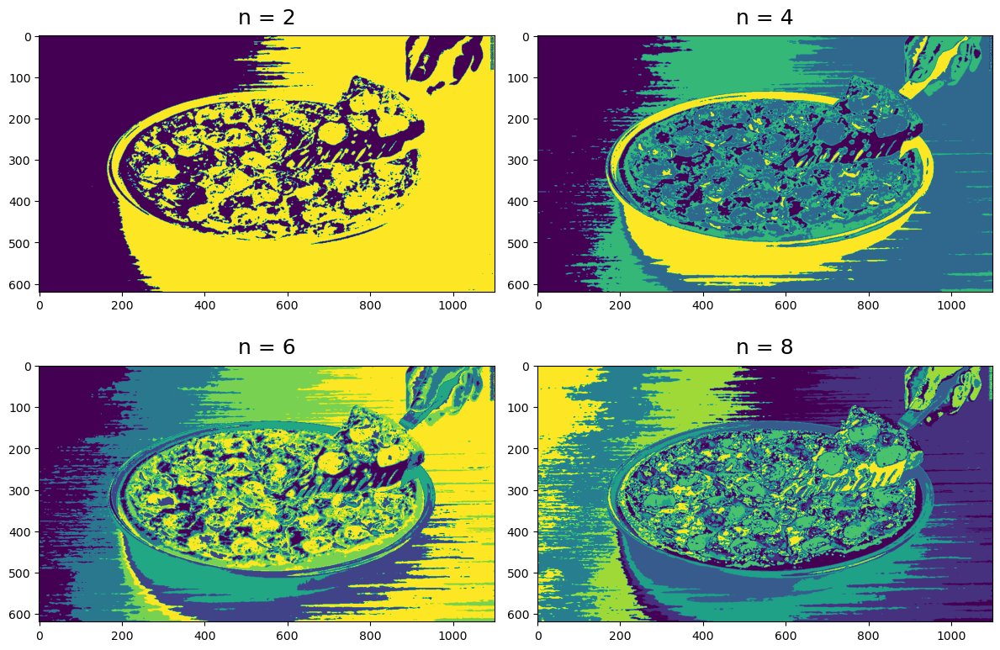

In [19]:
from sklearn import cluster
n_vals = [2,4,6,8]
plt.figure(1 , figsize = (12 , 8))

for subplot , n in enumerate(n_vals):
    kmeans = cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered , (dims[0] , dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n) , pad = 10 , size = 18)
    plt.imshow(clustered_img)

plt.tight_layout()

# Exploratory Data Analysis (EDA)
Let's visualize number of training examples for each food item

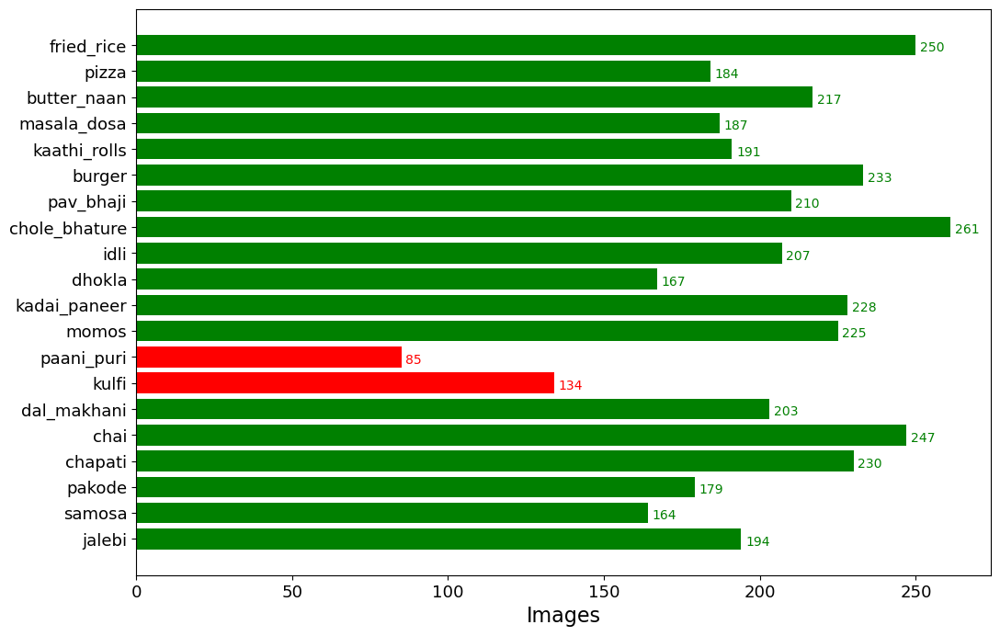

In [21]:
import os

train = 'dataset/Dataset/train/'

data = dict()

for i in os.listdir(train):
    sub_dir = os.path.join(train , i)
    count = len(os.listdir(sub_dir))
    data[i] = count

keys = data.keys()
values = data.values()

colors = ["red" if x<= 150 else "green" for x in values]

fig , ax = plt.subplots(figsize = (12,8))
y_pos = np.arange(len(values))
plt.barh(y_pos , values , align = "center" , color=colors)
for i , v in enumerate(values):
    ax.text(v+1.4 , i-0.25 , str(v), color = colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()  


**We notice that 2 classes (Pani puri and Kulfi) lacks behind with training data.**
 - Data augmentation helps with classes not having enough training
   examples by increasing the amount of relevant data in the dataset.

 - We would be doing what is known as **offline augmentation**. 
    It works on relatively smaller datasets, by increasing the 
    size of the dataset by a factor equal to the number of transformations you perform. 
    (For example, by flipping all my images, it would increase the size of the dataset by a factor of 2).

Let's visualize our dataset by randomly picking an image from every class

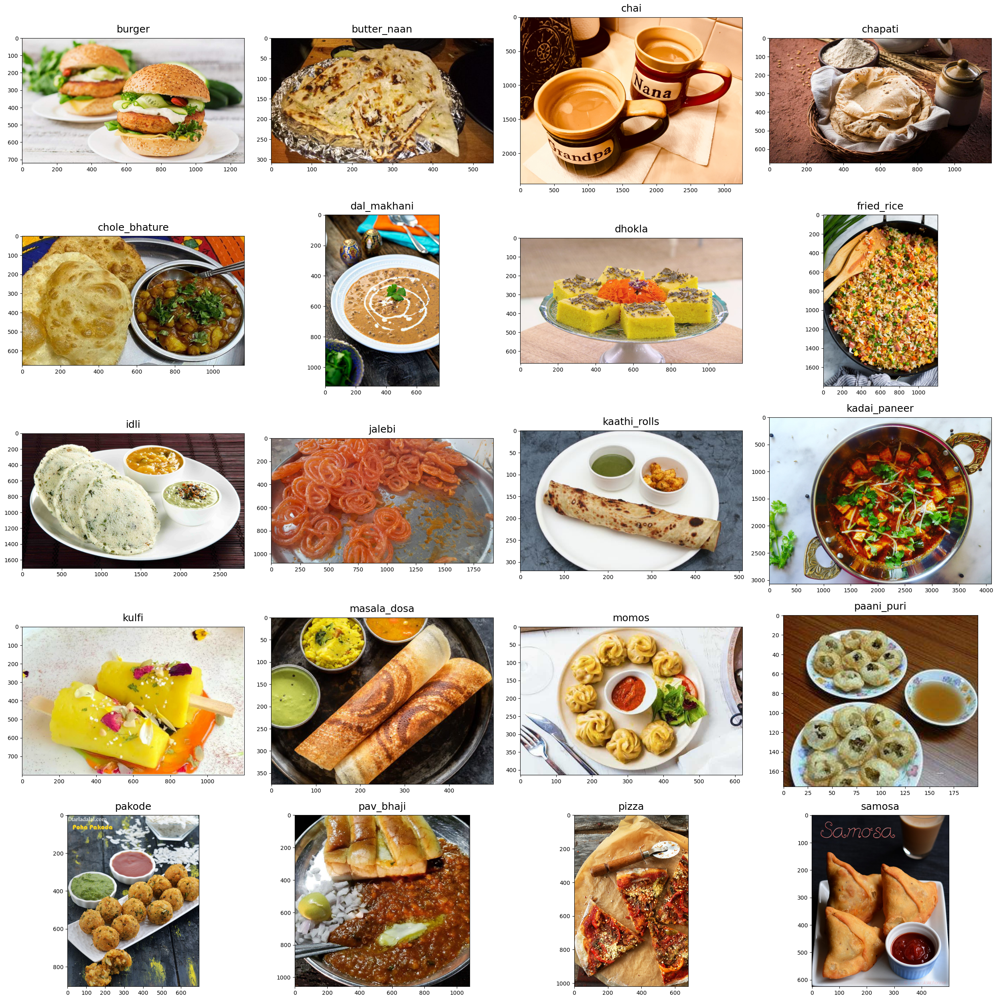

In [24]:
import random

train_folder = "dataset/Dataset/train"
images = []

for food_folder in sorted(os.listdir(train_folder)):
    food_items = os.listdir(train_folder + "/" + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder , food_folder , food_selected))
    
    
fig = plt.figure(1 , figsize = (25,25))
for subplot , image_ in enumerate(images):
    category = image_.split("/")[-2]
    imgs = plt.imread(image_)
    a ,b, c = imgs.shape
    fig = plt.subplot(5 , 4 , subplot+1)
    fig.set_title(category , pad = 10 , size = 18)
    plt.imshow(imgs)
    
plt.tight_layout()

We discussed Data Augmentation before. Let's see how it works:
1. Accepting a batch of images used for training.

2. Taking this batch and applying a series of random transformations to each image in the batch. (including random rotation, resizing, shearing, etc.)

3. Replacing the original batch with the new, randomly transformed batch.

4. Training the CNN on this randomly transformed batch. (i.e, the original data itself is not used for training)

## Model Training and Data Augmentation

In [29]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

n_classes = 20
batch_size = 32
img_width , img_height = 299 , 299

train_data_dir = 'dataset/Dataset/train'

# Data Augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True)


val_data_dir = 'dataset/Dataset/val'
val_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 3996 images belonging to 20 classes.
Found 1250 images belonging to 20 classes.


In [30]:
class_map = train_generator.class_indices
class_map

{'burger': 0,
 'butter_naan': 1,
 'chai': 2,
 'chapati': 3,
 'chole_bhature': 4,
 'dal_makhani': 5,
 'dhokla': 6,
 'fried_rice': 7,
 'idli': 8,
 'jalebi': 9,
 'kaathi_rolls': 10,
 'kadai_paneer': 11,
 'kulfi': 12,
 'masala_dosa': 13,
 'momos': 14,
 'paani_puri': 15,
 'pakode': 16,
 'pav_bhaji': 17,
 'pizza': 18,
 'samosa': 19}

## Training the model


In [32]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

nb_train_samples = 3583
nb_valid_samples = 1089

image_size = [299 , 299]

inception = InceptionV3(input_shape = image_size + [3] , weights = "imagenet" , include_top = False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128 , activation = "relu")(x)
x = Dropout(0.2)(x)

predictions = Dense(n_classes , kernel_regularizer = l2(0.005) , activation = "softmax")(x)

model = Model(inputs = inception.input , outputs = predictions)
model.compile(optimizer = SGD(learning_rate=0.0001 , momentum = 0.9) , loss = "categorical_crossentropy" , metrics = ["accuracy"])

checkpoints = ModelCheckpoint(filepath = "v1_inceptionV3.keras" , verbose = 1 , save_best_only = True)
csv_logger = CSVLogger("history_v1_inceptionV3.log")

history = model.fit(train_generator,
                             steps_per_epoch = nb_train_samples // batch_size,
                             validation_data = val_generator,
                             validation_steps = nb_valid_samples // batch_size,
                             epochs = 20,
                             verbose = 1,
                             callbacks = [csv_logger , checkpoints])

2024-05-14 17:26:22.264552: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2024-05-14 17:26:22.264577: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2024-05-14 17:26:22.264581: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2024-05-14 17:26:22.264598: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-05-14 17:26:22.264610: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Epoch 1/20


2024-05-14 17:26:28.728494: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.0557 - loss: 3.2370
Epoch 1: val_loss improved from inf to 3.02996, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 362s 3s/step - accuracy: 0.0559 - loss: 3.2365 - val_accuracy: 0.1590 - val_loss: 3.0300
Epoch 2/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - accuracy: 0.1136 - loss: 3.0810

2024-05-14 17:32:58.076459: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:32:58.076926: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 17:32:58.077508: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/gradient_tape/functional_1_1/global_average_pooling2d_1/mod/_403]]
2024-05-14 17:32:58.077527: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 17:32:58.077639: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 2499641168930021724
2024-05-14 17:32:58.077650: I tensorflow/core/framework/local_rendezvous.cc:422] Local re


Epoch 2: val_loss did not improve from 3.02996
111/111 ━━━━━━━━━━━━━━━━━━━━ 38s 321ms/step - accuracy: 0.1119 - loss: 3.0807 - val_accuracy: 0.1420 - val_loss: 3.0392
Epoch 3/20


2024-05-14 17:33:04.654579: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:33:04.654630: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]
2024-05-14 17:33:04.654658: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 1101787806193095480


111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1729 - loss: 2.9855
Epoch 3: val_loss improved from 3.02996 to 2.81465, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 296s 3s/step - accuracy: 0.1732 - loss: 2.9850 - val_accuracy: 0.3180 - val_loss: 2.8146
Epoch 4/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - accuracy: 0.2685 - loss: 2.8477

2024-05-14 17:38:34.137557: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:38:34.138151: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 17:38:34.138408: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/gradient_tape/functional_1_1/global_average_pooling2d_1/mod/_403]]
2024-05-14 17:38:34.138640: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 2499641168930021724
2024-05-14 17:38:34.138769: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 17:38:34.138778: I tensorflow/core/framework/local_rendezvous.cc:422] Local re


Epoch 4: val_loss did not improve from 2.81465


2024-05-14 17:38:36.933961: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:38:36.933989: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 1101787806193095480
2024-05-14 17:38:36.934239: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]


111/111 ━━━━━━━━━━━━━━━━━━━━ 36s 301ms/step - accuracy: 0.3011 - loss: 2.8197 - val_accuracy: 0.3395 - val_loss: 2.8572
Epoch 5/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3242 - loss: 2.7226
Epoch 5: val_loss improved from 2.81465 to 2.54081, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 277s 2s/step - accuracy: 0.3244 - loss: 2.7223 - val_accuracy: 0.4789 - val_loss: 2.5408
Epoch 6/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.3734 - loss: 2.5712

2024-05-14 17:43:45.825911: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:43:45.826161: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/ArgMax_1/_414]]
2024-05-14 17:43:45.826468: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 17:43:45.826486: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 17:43:45.826712: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 18406257291294554821
2024-05-14 17:43:45.826723: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 2499641168


Epoch 6: val_loss improved from 2.54081 to 2.49631, saving model to v1_inceptionV3.keras


2024-05-14 17:43:48.644602: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:43:48.644636: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 1101787806193095480
2024-05-14 17:43:48.644778: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]


111/111 ━━━━━━━━━━━━━━━━━━━━ 35s 297ms/step - accuracy: 0.3689 - loss: 2.5863 - val_accuracy: 0.5000 - val_loss: 2.4963
Epoch 7/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4351 - loss: 2.4602
Epoch 7: val_loss improved from 2.49631 to 2.22873, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 278s 2s/step - accuracy: 0.4353 - loss: 2.4596 - val_accuracy: 0.5901 - val_loss: 2.2287
Epoch 8/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.5734 - loss: 2.1575

2024-05-14 17:48:58.716343: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/gradient_tape/functional_1_1/global_average_pooling2d_1/mod/_403]]
2024-05-14 17:48:58.716878: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:48:58.717147: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 17:48:58.717158: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 17:48:58.717458: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 18406257291294554821
2024-05-14 17:48:58.717472: I tensorflow/core/framework/local_rendezvous.cc:422] Local r


Epoch 8: val_loss did not improve from 2.22873
111/111 ━━━━━━━━━━━━━━━━━━━━ 34s 287ms/step - accuracy: 0.5483 - loss: 2.2130 - val_accuracy: 0.5370 - val_loss: 2.2391
Epoch 9/20


2024-05-14 17:49:01.201874: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:49:01.201913: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 1101787806193095480
2024-05-14 17:49:01.201998: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]


111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5481 - loss: 2.1527
Epoch 9: val_loss improved from 2.22873 to 1.90644, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 276s 2s/step - accuracy: 0.5483 - loss: 2.1521 - val_accuracy: 0.6618 - val_loss: 1.9064
Epoch 10/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 4:38 3s/step - accuracy: 0.6859 - loss: 1.8642

2024-05-14 17:54:18.554565: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:54:18.555246: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 17814083595925600274
2024-05-14 17:54:18.555251: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 17:54:18.555257: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5027921843953200396
2024-05-14 17:54:18.555261: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/SGD/add/_16]]
2024-05-14 17:54:18.555435: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 691810057198


Epoch 10: val_loss did not improve from 1.90644
111/111 ━━━━━━━━━━━━━━━━━━━━ 45s 373ms/step - accuracy: 0.6307 - loss: 1.8935 - val_accuracy: 0.6481 - val_loss: 1.9339
Epoch 11/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6263 - loss: 1.8663
Epoch 11: val_loss improved from 1.90644 to 1.64532, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 288s 3s/step - accuracy: 0.6265 - loss: 1.8658 - val_accuracy: 0.7206 - val_loss: 1.6453
Epoch 12/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.7044 - loss: 1.6141

2024-05-14 17:59:42.774599: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 17:59:42.775292: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 17:59:42.775301: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/gradient_tape/functional_1_1/global_average_pooling2d_1/mod/_403]]
2024-05-14 17:59:42.775328: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 17:59:42.775784: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 18406257291294554821
2024-05-14 17:59:42.775790: I tensorflow/core/framework/local_rendezvous.cc:422] Local r


Epoch 12: val_loss improved from 1.64532 to 1.43422, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 36s 302ms/step - accuracy: 0.7033 - loss: 1.6245 - val_accuracy: 0.7531 - val_loss: 1.4342
Epoch 13/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6837 - loss: 1.6218
Epoch 13: val_loss improved from 1.43422 to 1.37820, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 281s 2s/step - accuracy: 0.6839 - loss: 1.6212 - val_accuracy: 0.7721 - val_loss: 1.3782
Epoch 14/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - accuracy: 0.7524 - loss: 1.3651

2024-05-14 18:04:58.577623: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 18:04:58.578161: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/gradient_tape/functional_1_1/global_average_pooling2d_1/mod/_403]]
2024-05-14 18:04:58.578196: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 18:04:58.578207: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 18:04:58.578474: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 18406257291294554821
2024-05-14 18:04:58.578500: I tensorflow/core/framework/local_rendezvous.cc:422] Local r


Epoch 14: val_loss did not improve from 1.37820
111/111 ━━━━━━━━━━━━━━━━━━━━ 34s 287ms/step - accuracy: 0.7542 - loss: 1.3453 - val_accuracy: 0.7654 - val_loss: 1.3899
Epoch 15/20


2024-05-14 18:05:01.162582: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 18:05:01.162613: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 1101787806193095480
2024-05-14 18:05:01.162884: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]


111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7372 - loss: 1.4201
Epoch 15: val_loss improved from 1.37820 to 1.17620, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 277s 2s/step - accuracy: 0.7373 - loss: 1.4195 - val_accuracy: 0.7987 - val_loss: 1.1762
Epoch 16/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - accuracy: 0.8067 - loss: 1.1572

2024-05-14 18:10:08.910919: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/functional_1_1/dropout_1/add/_14]]
2024-05-14 18:10:08.911215: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 18:10:08.911468: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 18:10:08.911473: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 18:10:08.911704: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 18406257291294554821
2024-05-14 18:10:08.911718: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. K


Epoch 16: val_loss improved from 1.17620 to 1.09306, saving model to v1_inceptionV3.keras


2024-05-14 18:10:11.693749: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 18:10:11.693766: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 1101787806193095480
2024-05-14 18:10:11.693811: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]


111/111 ━━━━━━━━━━━━━━━━━━━━ 35s 293ms/step - accuracy: 0.8001 - loss: 1.1885 - val_accuracy: 0.8519 - val_loss: 1.0931
Epoch 17/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7760 - loss: 1.1880
Epoch 17: val_loss improved from 1.09306 to 1.00040, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 277s 2s/step - accuracy: 0.7760 - loss: 1.1878 - val_accuracy: 0.8336 - val_loss: 1.0004
Epoch 18/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.7933 - loss: 1.0626

2024-05-14 18:15:22.408272: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 18:15:22.409174: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/SGD/add/_16]]
2024-05-14 18:15:22.409549: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 17814083595925600274
2024-05-14 18:15:22.409557: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 18:15:22.409561: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 18:15:22.409566: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 502792184395


Epoch 18: val_loss improved from 1.00040 to 0.97655, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 39s 329ms/step - accuracy: 0.8023 - loss: 1.0698 - val_accuracy: 0.8642 - val_loss: 0.9765
Epoch 19/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8083 - loss: 1.0626
Epoch 19: val_loss improved from 0.97655 to 0.89522, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 281s 2s/step - accuracy: 0.8084 - loss: 1.0623 - val_accuracy: 0.8529 - val_loss: 0.8952
Epoch 20/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.8660 - loss: 0.9089

2024-05-14 18:20:44.485655: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/functional_1_1/dropout_1/stateless_dropout/stateless_random_uniform/StatelessRandomGetKeyCounter/_406]]
2024-05-14 18:20:44.486322: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-14 18:20:44.486360: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 17814083595925600274
2024-05-14 18:20:44.486370: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 10627978315568566610
2024-05-14 18:20:44.486374: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6918100571982301859
2024-05-14 18:20:44.486656: I tensorflow/core/frame


Epoch 20: val_loss improved from 0.89522 to 0.80973, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 39s 324ms/step - accuracy: 0.8466 - loss: 0.9296 - val_accuracy: 0.8704 - val_loss: 0.8097


In [47]:
# Save the model
model.save("model_inceptionV3.h5")

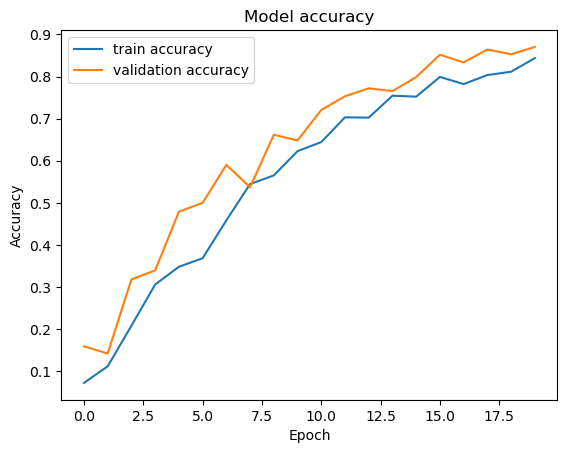

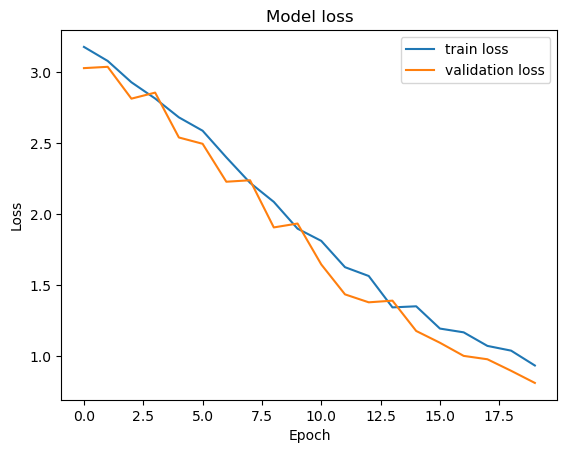

In [49]:
## Accuracy and Loss Curves

def plot_accuracy(history):
    
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()
    
def plot_loss(history):
    
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()
    
plot_accuracy(history)
plot_loss(history)
    

## Prediction

In [51]:
# load the model
K.clear_session()
model_path = "./model_inceptionV3.h5"
print("loading the model..")
model = load_model(model_path)
print("Done!")

loading the model..


Done!


## Testing Model on Test Set

In [55]:
test_data_dir = 'test'

test_datagen = ImageDataGenerator(rescale = 1./255)

test_generator = test_datagen.flow_from_directory(test_data_dir,
                                                 target_size = (img_height , img_width),
                                                 batch_size = batch_size,
                                                 class_mode = "categorical")

Found 585 images belonging to 20 classes.


In [59]:
scores = model.evaluate(test_generator)
print("Test Accuracy : {:.3f}".format(scores[1]))

19/19 ━━━━━━━━━━━━━━━━━━━━ 17s 528ms/step - accuracy: 0.7316 - loss: 1.3375
Test Accuracy : 0.750


1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


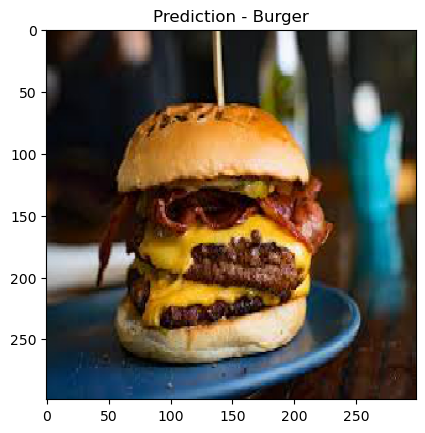

In [63]:
# Function to predict single image or predict all images from a directory
category={
    0: ['burger','Burger'], 1: ['butter_naan','Butter Naan'], 2: ['chai','Chai'],
    3: ['chapati','Chapati'], 4: ['chole_bhature','Chole Bhature'], 5: ['dal_makhani','Dal Makhani'],
    6: ['dhokla','Dhokla'], 7: ['fried_rice','Fried Rice'], 8: ['idli','Idli'], 9: ['jalegi','Jalebi'],
    10: ['kathi_rolls','Kaathi Rolls'], 11: ['kadai_paneer','Kadai Paneer'], 12: ['kulfi','Kulfi'],
    13: ['masala_dosa','Masala Dosa'], 14: ['momos','Momos'], 15: ['paani_puri','Paani Puri'],
    16: ['pakode','Pakode'], 17: ['pav_bhaji','Pav Bhaji'], 18: ['pizza','Pizza'], 19: ['samosa','Samosa']
}

def predict_image(filename , model):
    img_ = image.load_img(filename , target_size = (299,299))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array , axis = 0)
    img_processed /= 255.
    
    prediction = model.predict(img_processed)
    index = np.argmax(prediction)
    
    plt.title("Prediction - {}".format(category[index][1]))
    plt.imshow(img_array)
    
predict_image('test/burger/images (16).jpg' , model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━

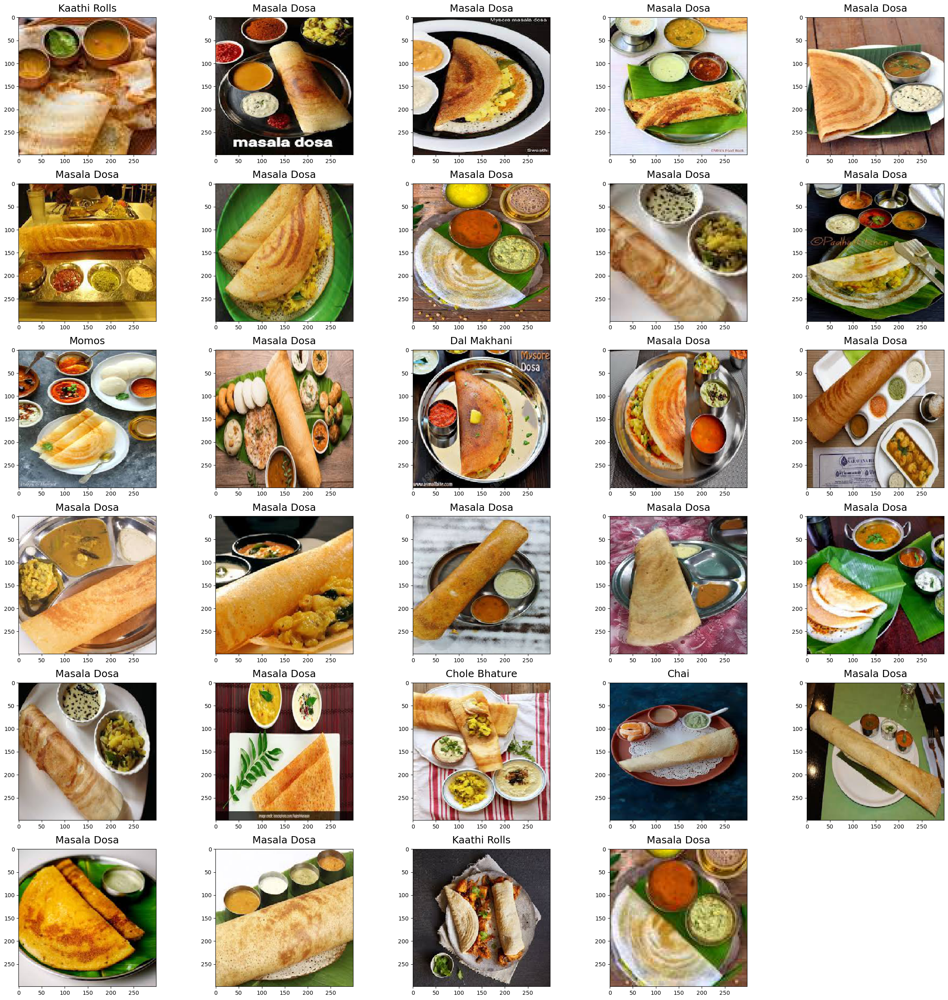

In [67]:
def predict_images(filenames , model):
    cols = 5
    pos = 0
    images = []
    total_images = len(os.listdir(filenames))
    rows = total_images // cols + 1
    
    true = filenames.split("/")[-1]
    fig = plt.figure(1 , figsize = (25,25))
    
    for i in sorted(os.listdir(filenames)):
        images.append(os.path.join(filenames , i))
        
    for subplot , imgs in enumerate(images):
        img_ = image.load_img(imgs , target_size = (299 , 299))
        img_array = image.img_to_array(img_)
        img_processed = np.expand_dims(img_array , axis = 0)
        img_processed /= 255.
        
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)
        
        preds = category.get(index)[0]
        if preds == true:
            pos+=1
            
        fig = plt.subplot(rows , cols , subplot+1)
        fig.set_title(category.get(index)[1] , pad = 10 , size = 18)
        plt.imshow(img_array)
        
    acc = pos/total_images
    print("Accuracy of Test : {:.2f} ({pos} / {total})".format(acc , pos = pos , total = total_images))
    plt.tight_layout()
    
predict_images("test/masala_dosa",model)

## Let's plot a confusion matrix for all the food items

In [83]:
from sklearn.metrics import confusion_matrix
import itertools

img_width, img_height = 299, 299

def labels_confusion_matrix():
    folder_path="test"
    
    mapping={}
    for i,j in enumerate(sorted(os.listdir(folder_path))):
        mapping[j]=i
    
    files=[]
    real=[]
    predicted=[]

    for i in os.listdir(folder_path):
        
        true=os.path.join(folder_path,i)
        true=true.split('/')[-1]
        true=mapping[true]
        
        for j in os.listdir(os.path.join(folder_path,i)):
            
            img_ = image.load_img(os.path.join(folder_path,i,j), target_size=(img_height, img_width))
            img_array = image.img_to_array(img_)
            img_processed = np.expand_dims(img_array, axis=0)
            img_processed /= 255.
            prediction = model.predict(img_processed)
            index = np.argmax(prediction)

            predicted.append(index)
            real.append(true)
            
    return (real,predicted)

def print_confusion_matrix(real,predicted):

    cmap="viridis"
    cm_plot_labels = [i for i in range(20)]

    cm = confusion_matrix(y_true=real, y_pred=predicted)
    df_cm = pd.DataFrame(cm,cm_plot_labels,cm_plot_labels)
    sns.set(font_scale=1.1) # for label size
    plt.figure(figsize = (15,10))
    s=sns.heatmap(df_cm, annot=True,cmap=cmap) # font size
#     bottom,top=s.get_ylim()
#     s.set_ylim(bottom+0.6,top-0.6)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig('confusion_matrix.png')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━

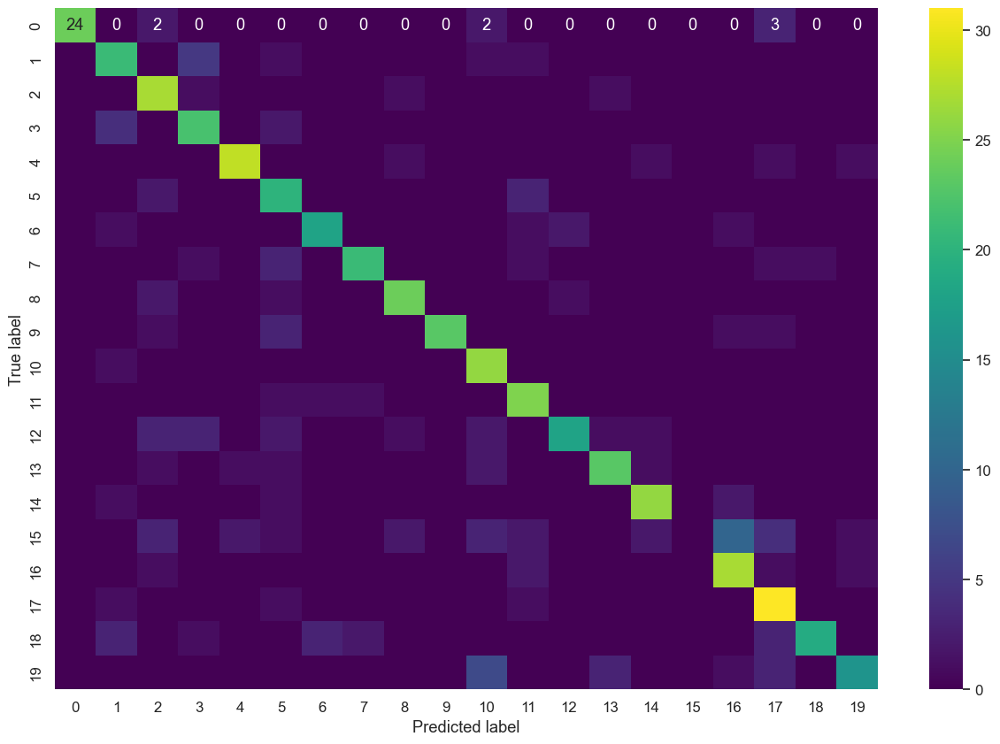

In [85]:
y_true,y_pred=labels_confusion_matrix()
print_confusion_matrix(y_true,y_pred)